In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
import folium


In [2]:
df = pd.read_csv('Pembrokeshire.csv')
df = df.drop(columns={'Unnamed: 0','voaBillingAuthorityName','laRatesReliefsDate',
                      'laRecordDate','laBillingReferenceCode'}).drop_duplicates()

In [3]:
def convert_to_quarter(cycle):
    year, cycle_num = cycle.split('_')
    quarter = int(cycle_num) 
    return pd.Period(f"{year}Q{quarter}")

df['laUpdateCycle'] = df['laUpdateCycle'].apply(convert_to_quarter)

In [4]:
df['laRatesPaid'] = df['laRatesPaid'].apply(lambda x: 0 if x < 0 else x)
df['laRatesReliefsAmount'] = df['laRatesReliefsAmount'].apply(lambda x: 0 if x < 0 else x)

In [5]:
df = df[df['laUpdateCycle'] > pd.Period('2018Q1', freq='Q-DEC')]
df['year'] = df['laUpdateCycle'].dt.year
df['filterPeriod'] = pd.to_datetime(df['filterPeriod'])

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49667 entries, 0 to 51151
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   voaUARN                49667 non-null  int64         
 1   laRatepayerName        19552 non-null  object        
 2   laOccupationState      49667 non-null  bool          
 3   laOccupationStateDate  49667 non-null  object        
 4   laRatesPaid            36365 non-null  float64       
 5   laRatesReliefs         7055 non-null   object        
 6   laRatesReliefsAmount   44584 non-null  float64       
 7   laUpdateCycle          49667 non-null  period[Q-DEC] 
 8   voaPropertyAddress     49667 non-null  object        
 9   voaPropertyPostcode    49667 non-null  object        
 10  voaPostcodeCentroid    49667 non-null  object        
 11  voaSCATCode            49667 non-null  int64         
 12  voaSCATName            49667 non-null  object        
 13  voaSub

# Bussiness rate Ratio

## Annually

In [7]:
# Record with 
df1 = df.dropna(subset=['voaRateableValue'])

In [8]:
r1=df1.groupby(['year']).laRatesPaid.sum()
r2=df1.groupby(['year']).voaRateableValue.sum()
r3 = pd.merge(r1, r2, left_on='year', right_on='year',how='inner')

In [9]:
r4 = r3.reset_index()
r4['ratio'] = r4['laRatesPaid']/r4['voaRateableValue']
r4

,year,laRatesPaid,voaRateableValue,ratio
0,2018,4.324225e+07,116152135.0,0.372290
1,2019,4.771650e+07,120099100.0,0.397309
2,2020,1.173592e+08,209157801.0,0.561104
3,2021,1.009878e+07,85021402.0,0.118779
4,2022,3.672924e+07,71829990.0,0.511336
5,2023,6.575736e+07,127684033.0,0.515001


In [10]:
# 2019+2020+2021 ----0.4374(2020)
a = r4[(r4['year'] == 2020) | (r4['year'] == 2021) | (r4['year'] == 2019)].laRatesPaid.sum()
b = r4[(r4['year'] == 2020) | (r4['year'] == 2021) | (r4['year'] == 2019)].voaRateableValue.sum()
a/b

0.4228424815605638

In [11]:
# 2020+2021+2022 ---0.4217(2021)
a = r4[(r4['year'] == 2020) | (r4['year'] == 2021) | (r4['year'] == 2022)].laRatesPaid.sum()
b = r4[(r4['year'] == 2020) | (r4['year'] == 2021) | (r4['year'] == 2022)].voaRateableValue.sum()
a/b

0.44858765580846816

In [12]:
def calculate_ratio(df, years):
    """Calculate the sum of `laRatesPaid` and `voaRateableValue` for specified years and return their ratio."""
    paid_sum = df[df['year'].isin(years)].laRatesPaid.sum()
    value_sum = df[df['year'].isin(years)].voaRateableValue.sum()
    ratio = paid_sum / value_sum  # Prevent division by zero
    return ratio

ratios = {
    '2019': calculate_ratio(r4, [2018, 2019, 2020]),
    '2020': calculate_ratio(r4, [2019, 2020, 2021]),
    '2021': calculate_ratio(r4, [2020, 2021, 2022]),
    '2022': calculate_ratio(r4, [2021, 2022, 2023]),
}

ratio = pd.DataFrame(list(ratios.items()), columns=['year', 'adjust_ratio'])
ratio['year'] = ratio['year'].astype('float64')
r5 = r4.merge(ratio, how='left')

expected = {
    'year': [2018, 2019, 2020, 2021, 2022, 2023],
    'expected_ratio': [0.4095, 0.4259, 0.4374, 0.4217, 0.4251, 0.4136]
}

expected = pd.DataFrame(expected)

r5 = r5.merge(expected, how='left')
r5

,year,laRatesPaid,voaRateableValue,ratio,adjust_ratio,expected_ratio
0,2018,4.324225e+07,116152135.0,0.372290,NaN,0.4095
1,2019,4.771650e+07,120099100.0,0.397309,0.467700,0.4259
2,2020,1.173592e+08,209157801.0,0.561104,0.422842,0.4374
3,2021,1.009878e+07,85021402.0,0.118779,0.448588,0.4217
4,2022,3.672924e+07,71829990.0,0.511336,0.395681,0.4251
5,2023,6.575736e+07,127684033.0,0.515001,NaN,0.4136


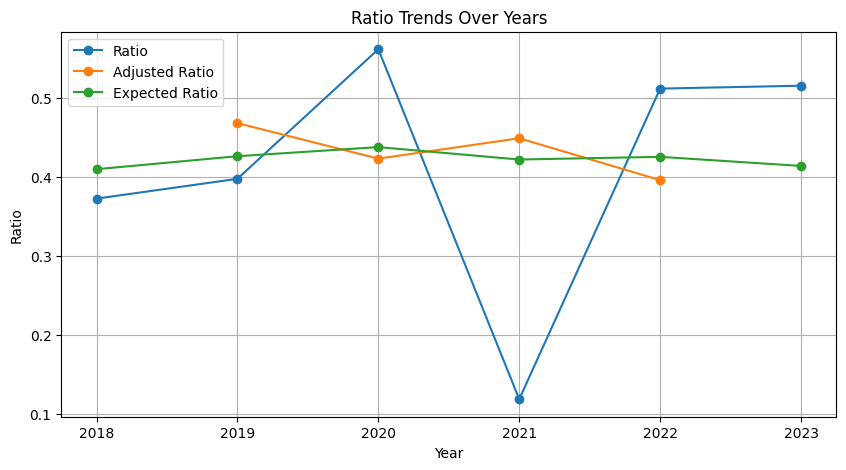

In [13]:
plt.figure(figsize=(10, 5))
plt.plot(r5['year'], r5['ratio'], label='Ratio', marker='o')
plt.plot(r5['year'], r5['adjust_ratio'], label='Adjusted Ratio', marker='o')
plt.plot(r5['year'], r5['expected_ratio'], label='Expected Ratio', marker='o')

# 设置图表标题和标签
plt.title('Ratio Trends Over Years')
plt.xlabel('Year')
plt.ylabel('Ratio')
plt.xticks(r5['year'])  # 确保每个年份都有标记
plt.legend()  # 添加图例

# 显示图表
plt.grid(True)
plt.show()

summary : Overall match the expected revenue by checking the quartely+ annually.
Shift on 2021 to 2020/2022 --Accountance actions+delayed payment

In [14]:
r11=df1.groupby(['laUpdateCycle']).laRatesPaid.sum()
r21=df1.groupby(['laUpdateCycle']).voaRateableValue.sum()
r31 = pd.merge(r11, r21, left_on='laUpdateCycle', right_on='laUpdateCycle',how='inner')
r41 = r31.reset_index()
r41['ratio'] = r41['laRatesPaid']/r41['voaRateableValue']
r41

,laUpdateCycle,laRatesPaid,voaRateableValue,ratio
0,2018Q2,6.281545e+04,178900.0,0.351120
1,2018Q3,6.397658e+04,183650.0,0.348361
2,2018Q4,4.311546e+07,115789585.0,0.372360
3,2019Q1,4.161250e+04,136200.0,0.305525
4,2019Q2,5.828950e+06,10753745.0,0.542039
5,2019Q3,4.970139e+06,14152810.0,0.351177
6,2019Q4,3.687580e+07,95056345.0,0.387936
7,2020Q1,4.793600e+04,94100.0,0.509416
8,2020Q2,9.397391e+07,165560970.0,0.567609
9,2020Q3,1.011576e+07,18521947.0,0.546150


note : 2021Q1----Covid relief?
       2023Q2----?

## By LSOA

# Floor Area

In [15]:
df2 = df.dropna(subset=['voaFloorArea'])

In [16]:
df2 = df2.drop_duplicates(subset=['filterPeriod', 'voaUARN'], keep='first')

In [17]:
f1=df2.groupby('filterPeriod').voaFloorArea.sum().reset_index()
f1['year']= f1.filterPeriod.dt.year

In [18]:
# voaFloorArea 每年的增长率

f2 =f1
f2['growth_rate'] = f2['voaFloorArea'].pct_change()*100
f2['growth_rate']


0         NaN
1    7.718653
2    3.007745
3    2.953911
4    0.643247
5    4.245763
Name: growth_rate, dtype: float64

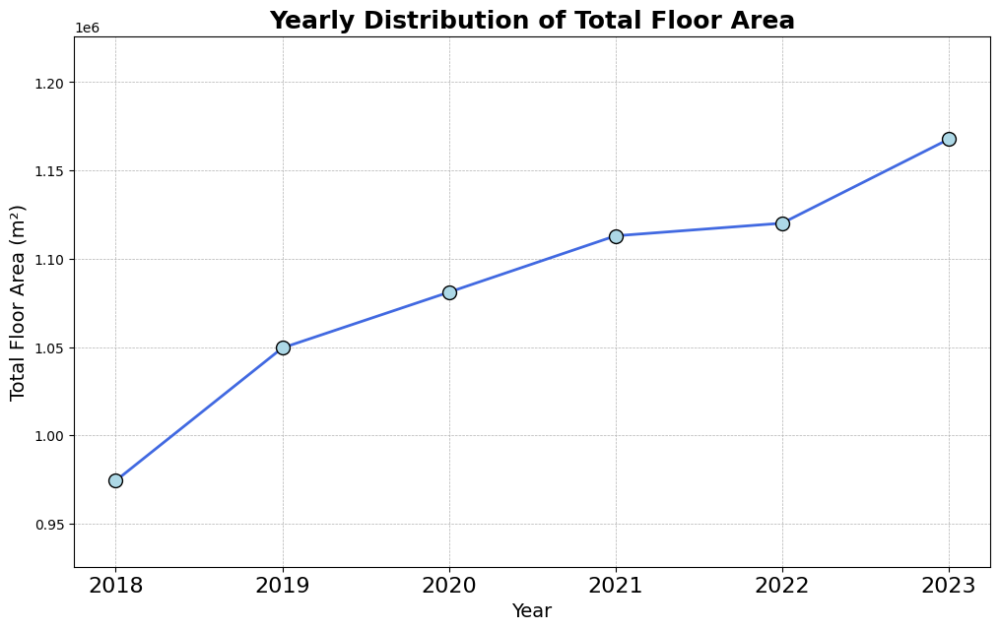

In [19]:
import matplotlib.pyplot as plt

# Create the figure and axis objects
plt.figure(figsize=(12, 7))

# Plot the data
plt.plot(f1['year'], f1['voaFloorArea'], marker='o', linestyle='-', color='royalblue', linewidth=2, markersize=6)

# Add titles and labels with larger font sizes for better readability
plt.title('Yearly Distribution of Total Floor Area', fontsize=18, weight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Floor Area (m²)', fontsize=14)

# Set limits for the y-axis with a more generous padding
plt.ylim(min(f1['voaFloorArea']) * 0.95, max(f1['voaFloorArea']) * 1.05)

# Rotate the x-axis labels for better readability and adjust their font size
plt.xticks(fontsize=16)

# Add gridlines for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Highlight the markers more visibly
plt.scatter(f1['year'], f1['voaFloorArea'], color='lightblue', edgecolor='black', s=100, zorder=5)

# Display the plot
plt.show()


# Category

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49667 entries, 0 to 51151
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   voaUARN                49667 non-null  int64         
 1   laRatepayerName        19552 non-null  object        
 2   laOccupationState      49667 non-null  bool          
 3   laOccupationStateDate  49667 non-null  object        
 4   laRatesPaid            36365 non-null  float64       
 5   laRatesReliefs         7055 non-null   object        
 6   laRatesReliefsAmount   44584 non-null  float64       
 7   laUpdateCycle          49667 non-null  period[Q-DEC] 
 8   voaPropertyAddress     49667 non-null  object        
 9   voaPropertyPostcode    49667 non-null  object        
 10  voaPostcodeCentroid    49667 non-null  object        
 11  voaSCATCode            49667 non-null  int64         
 12  voaSCATName            49667 non-null  object        
 13  voaSub

In [21]:
df3 = df.drop_duplicates(subset=['filterPeriod', 'voaUARN'], keep='first')

In [22]:
A=df3.groupby(['filterPeriod','voaCategory']).voaUARN.count()
A=pd.DataFrame(A).reset_index()
A1 = A.pivot_table(index=['filterPeriod'], 
                          columns='voaCategory', 
                          values='voaUARN').reset_index()

A1['filterPeriod'] = A1['filterPeriod'].dt.year.astype('string')

A1

voaCategory,filterPeriod,INDUSTRIAL,LEISURE,OFFICE,OTHER,RETAIL
0,2018,1133.0,2315.0,594.0,925.0,2044.0
1,2019,1209.0,2689.0,634.0,958.0,2125.0
2,2020,1275.0,2991.0,655.0,973.0,2190.0
3,2021,1359.0,3354.0,684.0,977.0,2244.0
4,2022,1377.0,3669.0,690.0,986.0,2271.0
5,2023,1411.0,3893.0,707.0,1001.0,2334.0


In [23]:
sns.set_palette("muted")


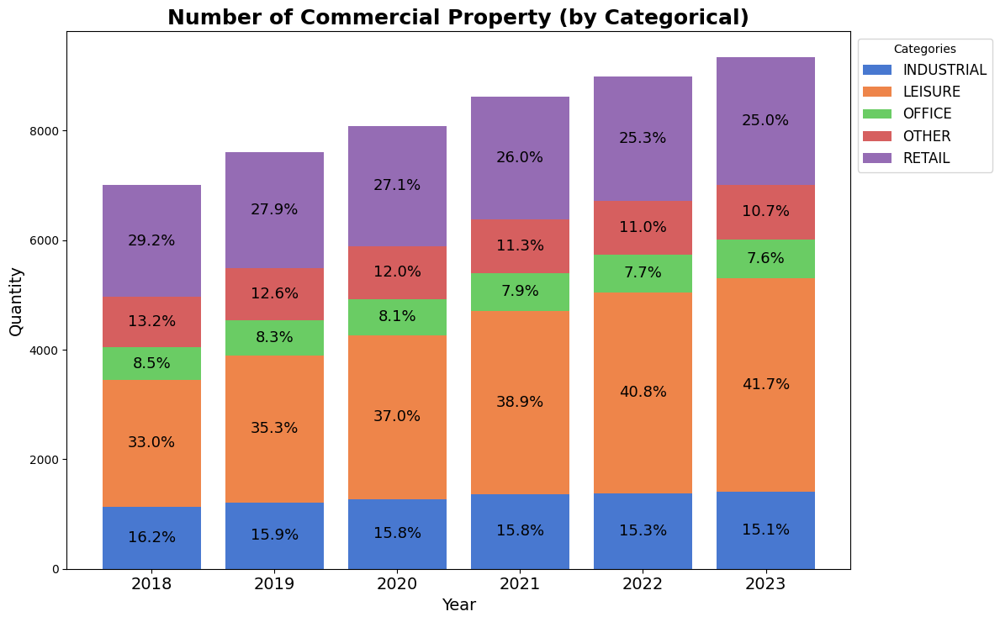

In [24]:
import seaborn as sns

A1['filterPeriod'] = A1['filterPeriod'].astype('string')

categories = ['INDUSTRIAL', 'LEISURE', 'OFFICE', 'OTHER', 'RETAIL']
bottom_values = np.zeros(len(A1['filterPeriod']))
plt.figure(figsize=(12, 7.5))

for category in categories:
    values = A1[category]

    plt.bar(A1['filterPeriod'], values, bottom=bottom_values, label=category)
  
    for i, (value, bottom) in enumerate(zip(values, bottom_values)):
        total = A1.loc[i, categories].sum()
        if total > 0:
            percentage = value / total * 100
            plt.text(A1['filterPeriod'].iloc[i], bottom + value / 2, f'{percentage:.1f}%', ha='center', va='center',fontsize=13)
    
    bottom_values += values


plt.title('Number of Commercial Property (by Categorical)',fontsize=18, weight='bold')
plt.xlabel('Year',fontsize=14)
plt.ylabel('Quantity',fontsize=14)
plt.xticks(fontsize=14)
plt.legend(title="Categories", loc='upper left', bbox_to_anchor=(1,1),fontsize=12)
plt.tight_layout()
plt.show()

In [25]:
A=df3.groupby(['filterPeriod','voaCategory']).voaFloorArea.sum()
A=pd.DataFrame(A).reset_index()
A2 = A.pivot_table(index=['filterPeriod'], 
                          columns='voaCategory', 
                          values='voaFloorArea').reset_index()

A2['filterPeriod'] = A2['filterPeriod'].dt.year.astype('string')

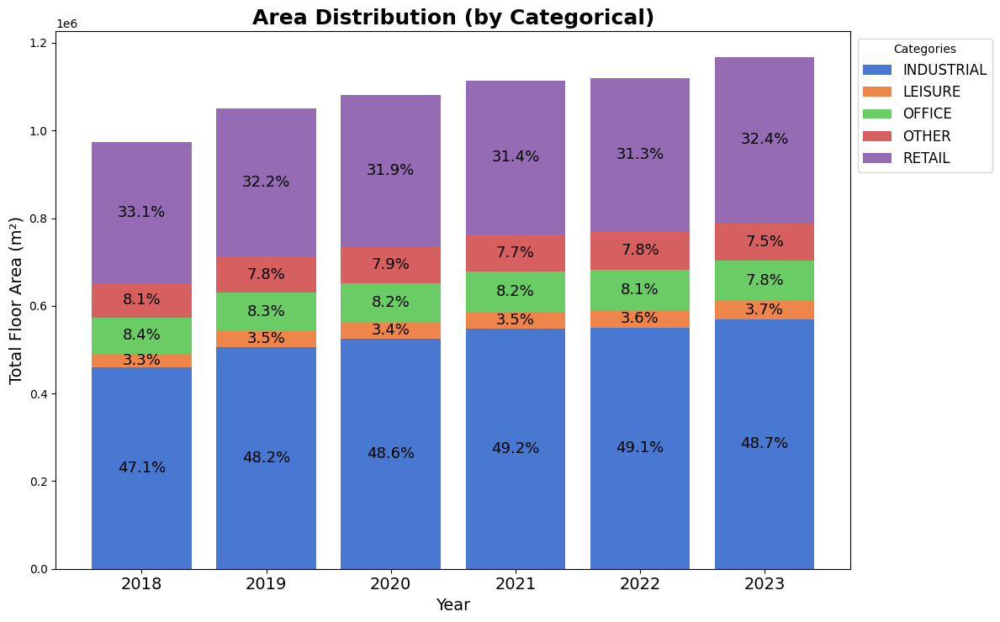

In [27]:
categories = ['INDUSTRIAL', 'LEISURE', 'OFFICE', 'OTHER', 'RETAIL']
bottom_values = np.zeros(len(A2['filterPeriod']))
plt.figure(figsize=(12, 7.5))

for category in categories:
    values = A2[category]

    plt.bar(A2['filterPeriod'], values, bottom=bottom_values, label=category)
  
    for i, (value, bottom) in enumerate(zip(values, bottom_values)):
        total = A2.loc[i, categories].sum()
        if total > 0:
            percentage = value / total * 100
            plt.text(A2['filterPeriod'].iloc[i], bottom + value / 2, f'{percentage:.1f}%', ha='center', va='center',fontsize=13)
    
    bottom_values += values

plt.title('Area Distribution (by Categorical)',fontsize=18, weight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Total Floor Area (m²)', fontsize=14)
plt.xticks(fontsize=14)
plt.legend(title="Categories", loc='upper left', bbox_to_anchor=(1,1),fontsize=12)
plt.tight_layout()
plt.show()

In [28]:
A=df3.groupby(['filterPeriod','voaCategory']).voaRateableValue.sum()
A=pd.DataFrame(A).reset_index()
A3 = A.pivot_table(index=['filterPeriod'], 
                          columns='voaCategory', 
                          values='voaRateableValue').reset_index()
A3['filterPeriod'] = A3['filterPeriod'].dt.year.astype('string')

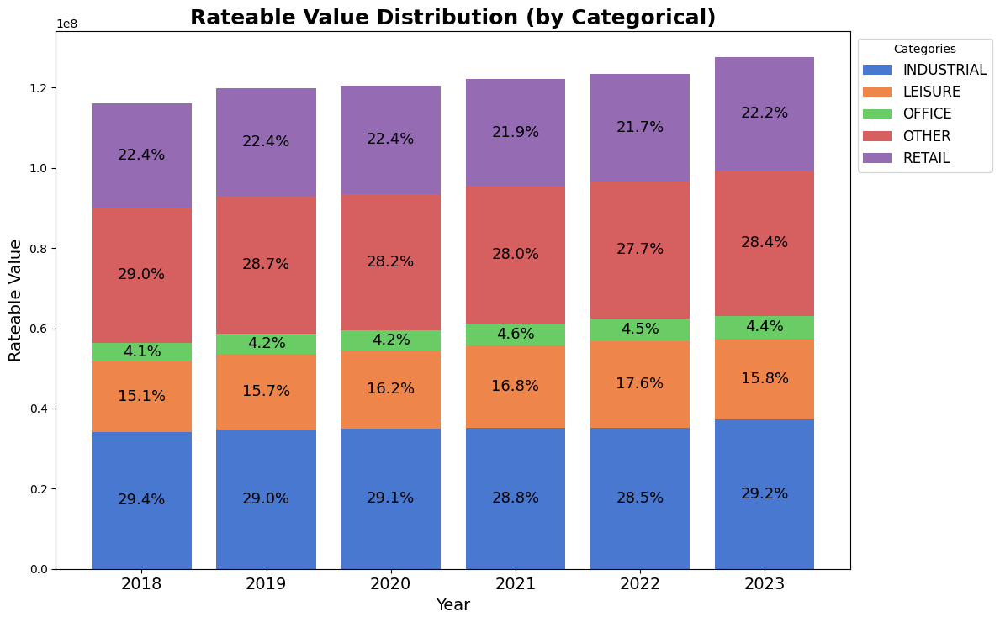

In [29]:
categories = ['INDUSTRIAL', 'LEISURE', 'OFFICE', 'OTHER', 'RETAIL']
bottom_values = np.zeros(len(A3['filterPeriod']))
plt.figure(figsize=(12, 7.5))

for category in categories:
    values = A3[category]

    plt.bar(A3['filterPeriod'], values, bottom=bottom_values, label=category)
  
    for i, (value, bottom) in enumerate(zip(values, bottom_values)):
        total = A3.loc[i, categories].sum()
        if total > 0:
            percentage = value / total * 100
            plt.text(A3['filterPeriod'].iloc[i], bottom + value / 2, f'{percentage:.1f}%', ha='center', va='center',fontsize=13)
    
    bottom_values += values


plt.title('Rateable Value Distribution (by Categorical)',fontsize=18, weight='bold')
plt.xlabel('Year', fontsize=14)
plt.ylabel('Rateable Value', fontsize=14)
plt.xticks(fontsize=14)
plt.legend(title="Categories", loc='upper left', bbox_to_anchor=(1,1),fontsize=12)
plt.tight_layout()
plt.show()

# Bussiness life span（）
for each voaUARN, define for each fliter period, its occupied date

In [30]:
df4 = df.copy()

In [31]:
df4['laOccupationStateDate'] = pd.to_datetime(df4['laOccupationStateDate'])
b1 = df4.groupby('voaUARN')['laOccupationStateDate'].min().reset_index()
b1.columns = ['voaUARN', 'startDate']
df4 = df4.merge(b1,how='inner')
b1

,voaUARN,startDate
0,6909000,2017-12-01
1,13484000,2006-04-01
2,15544000,1997-01-01
3,18017193,2009-12-23
4,22720193,2007-03-23
...,...,...
9341,14525972000,2023-10-01
9342,14525973000,2023-10-01
9343,14547536000,2023-10-01
9344,14547563000,2023-10-01


In [32]:
results = []

for uarn in df4['voaUARN'].unique():
    sub_df = df4[df4['voaUARN'] == uarn]
    for period in sub_df['filterPeriod'].unique():
        period_df = sub_df[sub_df['filterPeriod'] == period]
        if period_df['laOccupationState'].all():
            days = (period - sub_df['laOccupationStateDate'].min()).days
            results.append({'voaUARN': uarn, 'startDate': sub_df['laOccupationStateDate'].min(), 'filterPeriod': period, 'Days': days})
        else:
            state_date = period_df[period_df['laOccupationState'] == False]['laOccupationStateDate'].iloc[0]
            start =  period_df[period_df['laOccupationState'] == True]['laOccupationStateDate'].min()
            days = (state_date - start).days
            results.append({'voaUARN': uarn, 'startDate': sub_df['laOccupationStateDate'].min(), 'filterPeriod': period, 'Days': days})

# Create results DataFrame
b2 = pd.DataFrame(results)
b2

,voaUARN,startDate,filterPeriod,Days
0,6909000,2017-12-01,2018-12-31,395.0
1,6909000,2017-12-01,2019-12-31,760.0
2,6909000,2017-12-01,2020-12-31,1126.0
3,6909000,2017-12-01,2021-12-31,1491.0
4,6909000,2017-12-01,2022-12-31,1856.0
...,...,...,...,...
49662,14364718000,2023-10-01,2023-12-31,91.0
49663,14377825000,2023-10-01,2023-12-31,91.0
49664,14417593000,2023-10-01,2023-12-31,91.0
49665,14458451000,2023-10-01,2023-12-31,91.0


In [33]:
b2['fyear']=b2.filterPeriod.dt.year
b3 = b2.pivot(index='voaUARN', columns='fyear', values='Days')

# Reset the index i  f you want 'voaUARN' as a regular column:
b3.reset_index(inplace=True)

LOC = df4 [['voaUARN','LSOA']].drop_duplicates()
b4 = pd.merge(b3,LOC,on='voaUARN',how='left')
b4 = pd.merge(b4,b2[['voaUARN','startDate']],how='left').drop_duplicates()
b4

,voaUARN,2018,2019,2020,2021,2022,2023,LSOA,startDate
0,6909000,395.0,760.0,1126.0,1491.0,1856.0,NaN,W01000568,2017-12-01
6,13484000,4657.0,5022.0,5388.0,5753.0,6118.0,6483.0,W01000600,2006-04-01
12,15544000,8034.0,8399.0,8765.0,9130.0,9495.0,9860.0,W01000614,1997-01-01
18,18017193,3295.0,3660.0,4026.0,4391.0,4756.0,5121.0,W01000559,2009-12-23
24,22720193,4301.0,4666.0,5032.0,5397.0,5762.0,6127.0,W01000558,2007-03-23
...,...,...,...,...,...,...,...,...,...
49668,14525972000,NaN,NaN,NaN,NaN,NaN,91.0,W01000561,2023-10-01
49669,14525973000,NaN,NaN,NaN,NaN,NaN,91.0,W01000561,2023-10-01
49670,14547536000,NaN,NaN,NaN,NaN,NaN,91.0,W01000556,2023-10-01
49671,14547563000,NaN,NaN,NaN,NaN,NaN,91.0,W01000577,2023-10-01


In [34]:
b4.to_csv('lifespan.csv')

In [35]:
b4.describe()

,voaUARN,2018,2019,2020,2021,2022,2023,startDate
count,9.347000e+03,6945.000000,7440.000000,7786.000000,8356.000000,8721.000000,8773.000000,9347
mean,6.437369e+09,3668.246364,3839.740188,4000.296301,4152.271302,4368.087605,4542.527072,2011-07-03 10:42:25.843586048
min,6.909000e+06,91.000000,-43.000000,13.000000,9.000000,59.000000,91.000000,1994-12-01 00:00:00
25%,1.995787e+08,1004.000000,1152.000000,1370.000000,1587.500000,1830.000000,2050.000000,2005-04-04 12:00:00
50%,6.990917e+09,2921.000000,3017.500000,3046.000000,3176.000000,3318.000000,3439.000000,2014-06-30 00:00:00
75%,1.126058e+10,6513.000000,6439.000000,6477.750000,6432.500000,6483.000000,6806.000000,2018-04-28 00:00:00
max,1.457485e+10,8796.000000,9161.000000,9527.000000,9892.000000,10257.000000,10622.000000,2023-10-01 00:00:00
std,5.241984e+09,2978.159537,2994.537690,3009.921680,3049.313444,3078.252958,3140.768360,NaN


In [36]:
b4.sample(n=5) 

,voaUARN,2018,2019,2020,2021,2022,2023,LSOA,startDate
32571,8935476000,962.0,1327.0,1693.0,2058.0,2423.0,2788.0,W01000595,2016-05-13
47534,13236042000,NaN,NaN,NaN,854.0,1219.0,1584.0,W01000576,2019-08-30
48178,13541889000,NaN,NaN,NaN,91.0,456.0,821.0,W01000616,2021-10-01
41752,11311321000,639.0,1004.0,1370.0,1735.0,2100.0,2465.0,W01000554,2017-04-01
19161,1844073000,NaN,1581.0,1947.0,2312.0,2677.0,3042.0,W01000622,2015-09-02


In [37]:
b5=b4[[2018,2019,2020,2021,2022,2023]].median(numeric_only=True)
b5 = b5.astype(int).to_frame(name='Median')
b5

,Median
2018,2921
2019,3017
2020,3046
2021,3176
2022,3318
2023,3439


## By LSOA

In [38]:
b4.groupby('LSOA')[[2018,2019,2020,2021,2022,2023]].mean().astype(int)

,2018,2019,2020,2021,2022,2023
LSOA,,,,,,
W01000553,3849,4001,3999,4208,4279,4418
W01000554,4787,5115,4859,4926,5001,4554
W01000555,4004,4068,4050,3887,3860,4054
W01000556,4180,4121,4398,4663,4712,4816
W01000557,3986,4234,4288,4451,4671,4868
...,...,...,...,...,...,...
W01000619,3100,3298,3373,3393,3579,3781
W01000620,3703,3734,3878,4010,4246,4344
W01000621,3503,3533,3543,3736,3912,4124


# Vacancy
for each voaUARN, define for each fliter period, its occupied date

## Overall

In [39]:
df5 = df.copy()

In [40]:
def filter_records(group):
    if len(group) > 1:
        false_state = group[group['laOccupationState'] == False]
        if not false_state.empty:
            return false_state.iloc[0]  
    return group.iloc[0] 

v1 = df5.groupby(['voaUARN', 'filterPeriod']).apply(filter_records).reset_index(drop=True)

C:\Users\gg208\AppData\Local\Temp\ipykernel_51596\3755409896.py:8: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  v1 = df5.groupby(['voaUARN', 'filterPeriod']).apply(filter_records).reset_index(drop=True)


In [41]:
v1['Vacant'] = v1['laOccupationState'].apply(lambda x: 0 if x else 1)

In [ ]:
#v1.head()

### Overall Rate(Count)

In [42]:
v_r = v1.groupby(['filterPeriod']).Vacant.sum()
v_c = v1.groupby(['filterPeriod']).Vacant.count()
v_R = pd.merge(v_r, v_c,left_on=['filterPeriod'], right_on=['filterPeriod'],how='inner')
v_R = v_R.rename(columns={'Vacant_x':'Vacant','Vacant_y':'total'})
v_R['Vacan_rate'] = (v_R['Vacant']/v_R['total'])*100

In [43]:
v_R

,Vacant,total,Vacan_rate
filterPeriod,,,
2018-12-31,67,7011,0.955641
2019-12-31,176,7615,2.311228
2020-12-31,299,8084,3.698664
2021-12-31,263,8618,3.051752
2022-12-31,273,8993,3.035694
2023-12-31,574,9346,6.141665


### Overall Vacan Rate(Area + Valuation)

In [44]:
v2 = v1.copy()
v2['VArea'] = v2['Vacant']*v2['voaFloorArea']
v2['Vrate']= v2['Vacant']*v2['voaRateableValue']

In [45]:
v3 = v2.groupby(['filterPeriod'])['VArea'].sum()*100/v2.groupby(['filterPeriod'])['voaFloorArea'].sum()
v4 = v2.groupby(['filterPeriod'])['Vrate'].sum()*100/v2.groupby(['filterPeriod'])['voaRateableValue'].sum()
v3 = v3.reset_index().rename(columns={0: 'VacantAreaRate'})
v4 = v4.reset_index().rename(columns={0: 'VacantValueRate'})

In [46]:
v3

,filterPeriod,VacantAreaRate
0,2018-12-31,1.410054
1,2019-12-31,4.858101
2,2020-12-31,6.055769
3,2021-12-31,6.444509
4,2022-12-31,6.589298
5,2023-12-31,9.131831


In [47]:
v4

,filterPeriod,VacantValueRate
0,2018-12-31,0.393488
1,2019-12-31,1.605959
2,2020-12-31,1.541100
3,2021-12-31,1.471632
4,2022-12-31,1.625233
5,2023-12-31,2.763998


In [48]:
v_g = pd.merge(v_R.reset_index(),v3,on='filterPeriod',how='left')
v_g = pd.merge(v_g,v4,on='filterPeriod',how='left')
v_g

,filterPeriod,Vacant,total,Vacan_rate,VacantAreaRate,VacantValueRate
0,2018-12-31,67,7011,0.955641,1.410054,0.393488
1,2019-12-31,176,7615,2.311228,4.858101,1.605959
2,2020-12-31,299,8084,3.698664,6.055769,1.541100
3,2021-12-31,263,8618,3.051752,6.444509,1.471632
4,2022-12-31,273,8993,3.035694,6.589298,1.625233
5,2023-12-31,574,9346,6.141665,9.131831,2.763998


In [49]:
v_g['filterPeriod'] = v_g['filterPeriod'].dt.year

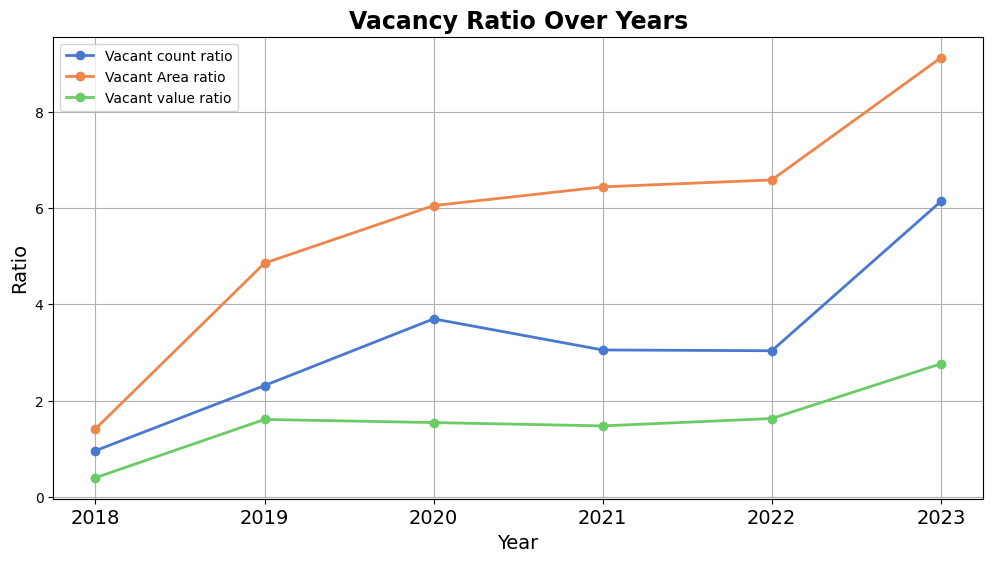

In [50]:
plt.figure(figsize=(12, 6))
plt.plot(v_g['filterPeriod'], v_g['Vacan_rate'], label='Vacant count ratio', marker='o',linewidth=2)
plt.plot(v_g['filterPeriod'], v_g['VacantAreaRate'], label='Vacant Area ratio', marker='o',linewidth=2)
plt.plot(v_g['filterPeriod'], v_g['VacantValueRate'], label='Vacant value ratio', marker='o',linewidth=2)


plt.title('Vacancy Ratio Over Years',fontsize=17, weight='bold')
plt.xlabel('Year',fontsize=14)
plt.ylabel('Ratio',fontsize=14)
plt.xticks(v_g['filterPeriod'],fontsize=14)  
plt.legend() 

# 显示图表
plt.grid(True)
plt.show()

C:\Users\gg208\AppData\Local\Temp\ipykernel_51596\3753782439.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=v2, x='filterPeriod', y='VArea', palette='viridis')


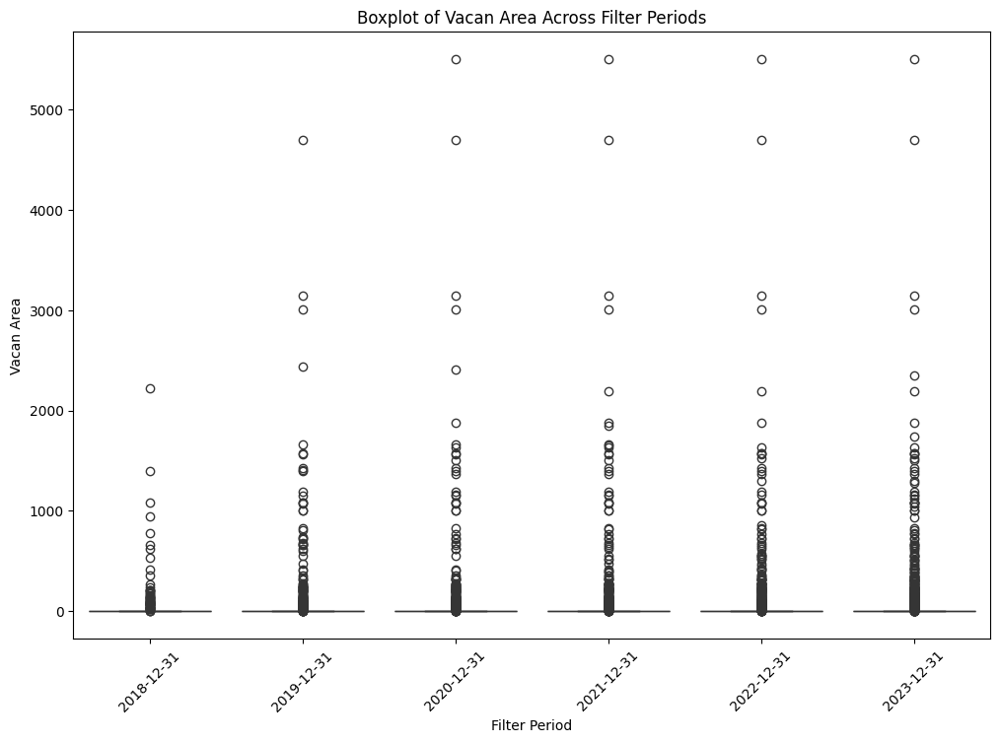

In [51]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=v2, x='filterPeriod', y='VArea', palette='viridis')
plt.title('Boxplot of Vacan Area Across Filter Periods')
plt.xlabel('Filter Period')
plt.ylabel('Vacan Area')
plt.xticks(rotation=45)
plt.show()

C:\Users\gg208\AppData\Local\Temp\ipykernel_51596\1794678413.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=v2, x='filterPeriod', y='voaRateableValue', palette='viridis')


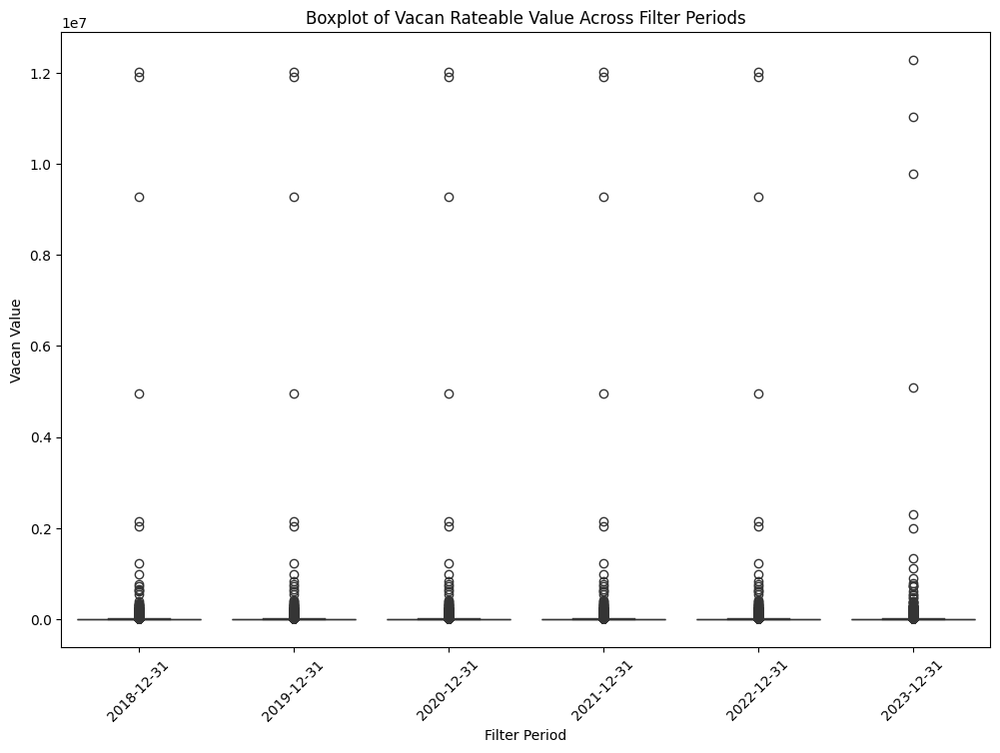

In [52]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=v2, x='filterPeriod', y='voaRateableValue', palette='viridis')
plt.title('Boxplot of Vacan Rateable Value Across Filter Periods')
plt.xlabel('Filter Period')
plt.ylabel('Vacan Value')
plt.xticks(rotation=45)

plt.show()

### Overall Vacan Category(?)

In [53]:
vacan_C1= v1.groupby(['voaCategory','filterPeriod']).Vacant.sum()
vacan_C2 = v1.groupby(['voaCategory','filterPeriod']).Vacant.count()
vacan_R = pd.merge(vacan_C1, vacan_C2,left_on=['voaCategory','filterPeriod'], right_on=['voaCategory','filterPeriod'],how='inner')
vacan_R = vacan_R.rename(columns={'Vacant_x':'Vacant','Vacant_y':'total'})
vacan_R['Vacan_rate'] = (vacan_R['Vacant']/vacan_R['total'])*100

In [59]:
v31 = v2.groupby(['voaCategory','filterPeriod'])['VArea'].sum()
v32 = v2.groupby(['voaCategory','filterPeriod'])['voaFloorArea'].sum()
v_g1 = pd.merge(vacan_R,v31,on=['voaCategory','filterPeriod'],how='left')
v_g1 = pd.merge(v_g1,v32,on=['voaCategory','filterPeriod'],how='left').reset_index()
v_g1['VacantAreaRate'] = (v_g1['VArea']/v_g1['voaFloorArea'])*100

In [60]:
v41 = v2.groupby(['voaCategory','filterPeriod'])['Vrate'].sum()
v42 = v2.groupby(['voaCategory','filterPeriod'])['voaRateableValue'].sum()
v_g1 = pd.merge(v_g1,v41,on=['voaCategory','filterPeriod'],how='left')
v_g1 = pd.merge(v_g1,v42,on=['voaCategory','filterPeriod'],how='left')
v_g1['VacantValueRate'] = (v_g1['Vrate']/v_g1['voaRateableValue'])*100
v_g1['filterPeriod'] = v_g1['filterPeriod'].dt.year.reset_index()

In [61]:
vacan_C= v_g1

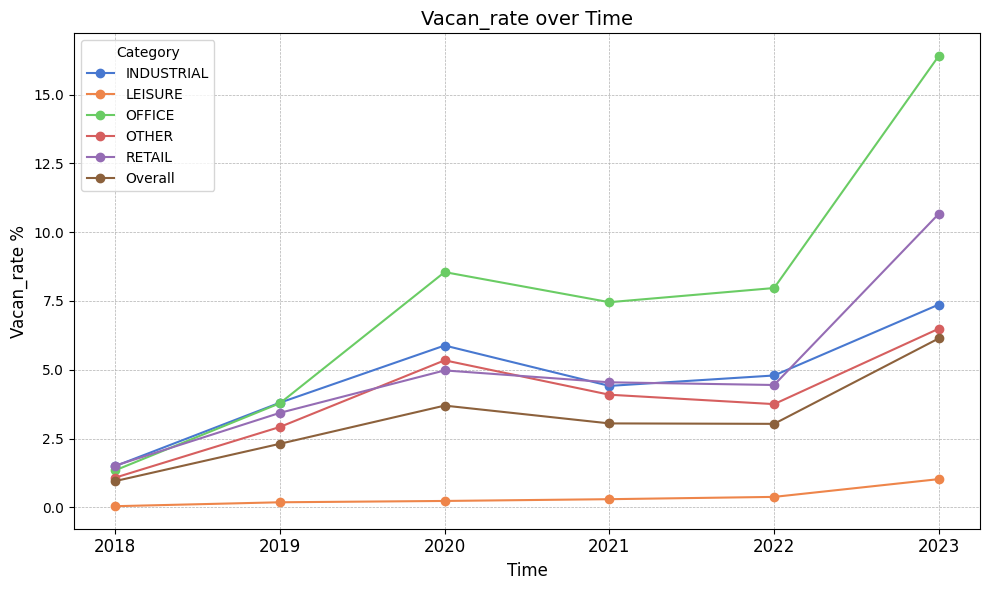

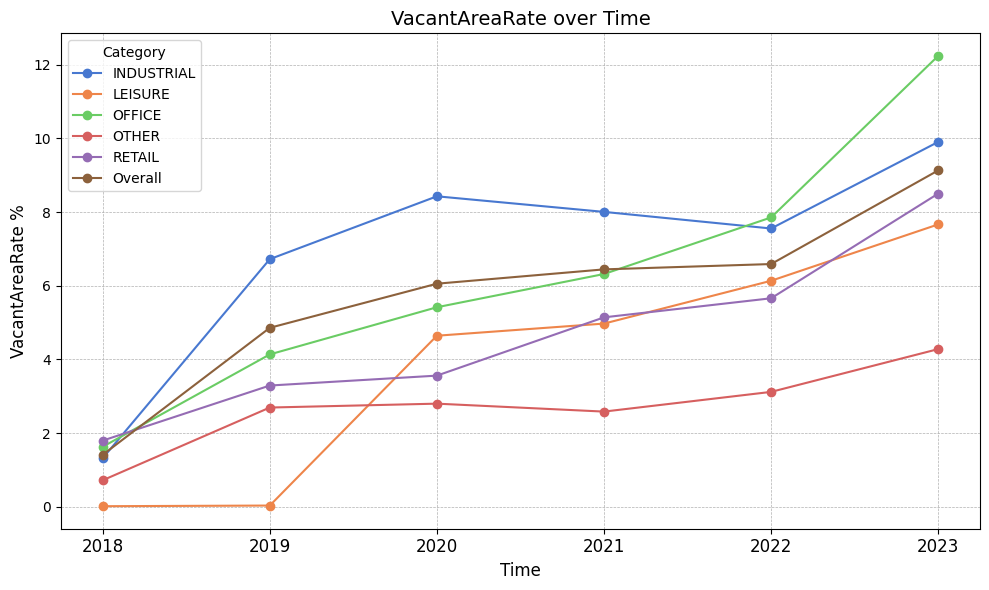

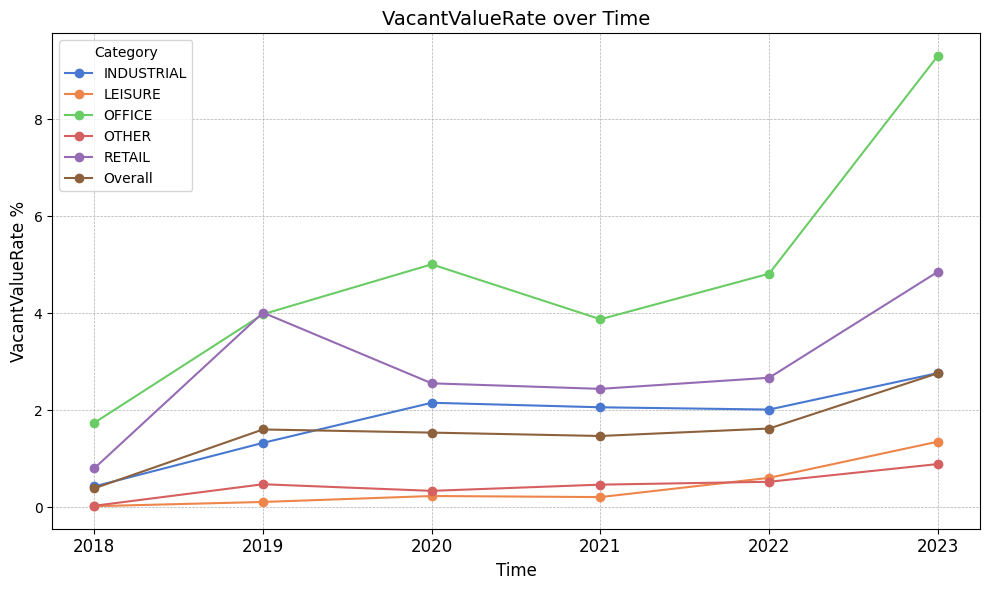

In [67]:
variables_to_plot = ['Vacan_rate', 'VacantAreaRate', 'VacantValueRate']

# Loop over each variable and create a plot
for variable in variables_to_plot:
    plt.figure(figsize=(10, 6))
    for category in v_g1['voaCategory'].unique():
        subset = v_g1[v_g1['voaCategory'] == category]
        plt.plot(subset['filterPeriod'], subset[variable], marker='o', label=category)
    plt.plot(v_g['filterPeriod'], v_g[variable], marker='o', label='Overall')
    plt.title(f'{variable} over Time',fontsize=14)
    plt.xlabel('Time',fontsize=12)
    plt.ylabel(f'{variable} %',fontsize=12)
    plt.legend(title='Category')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(fontsize=12)
    plt.tight_layout()
    plt.show()



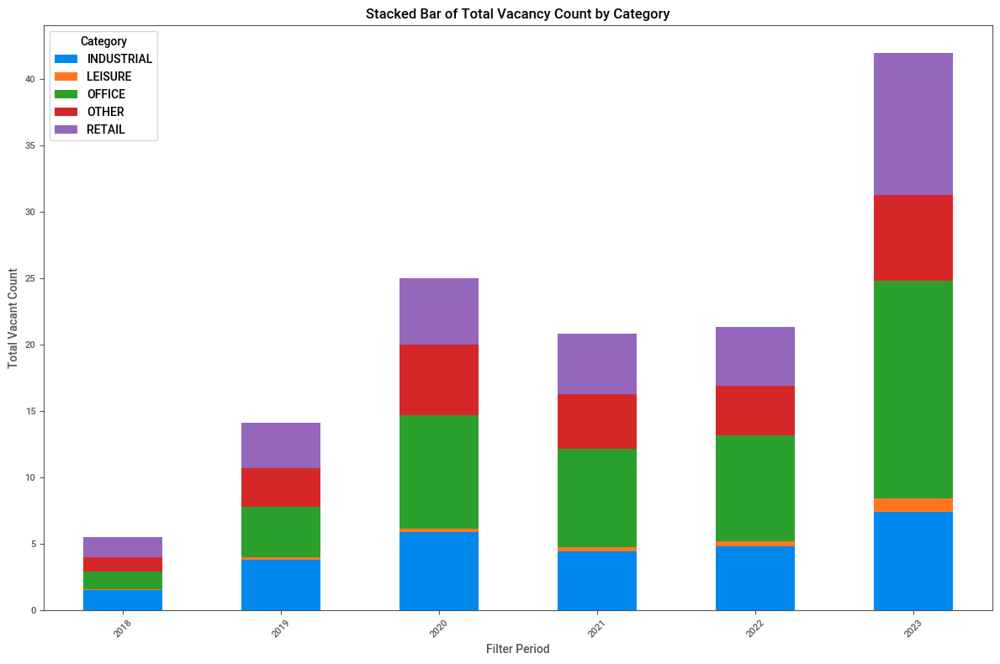

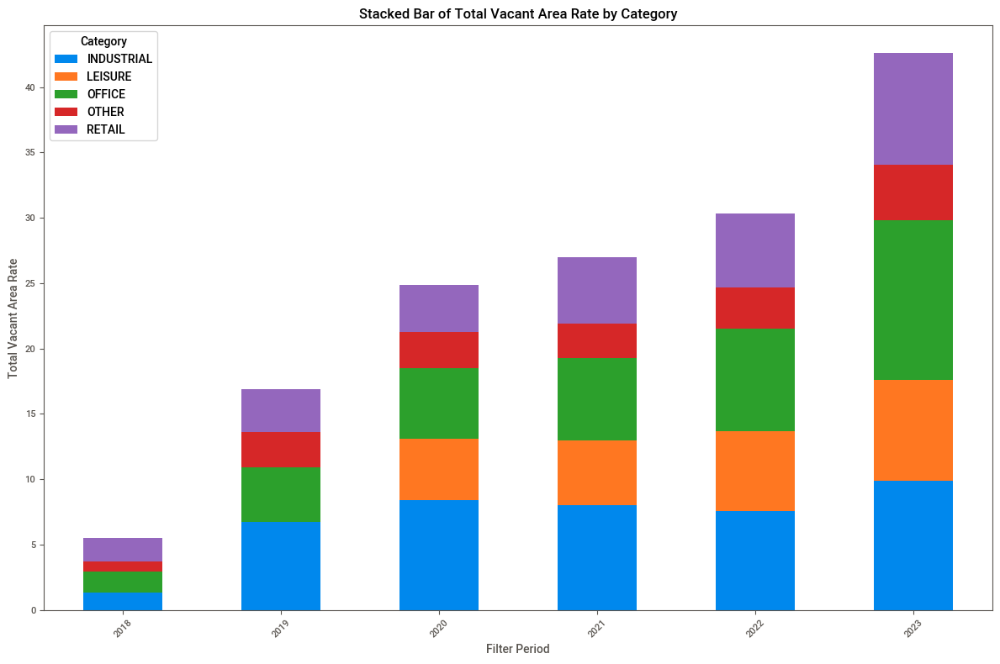

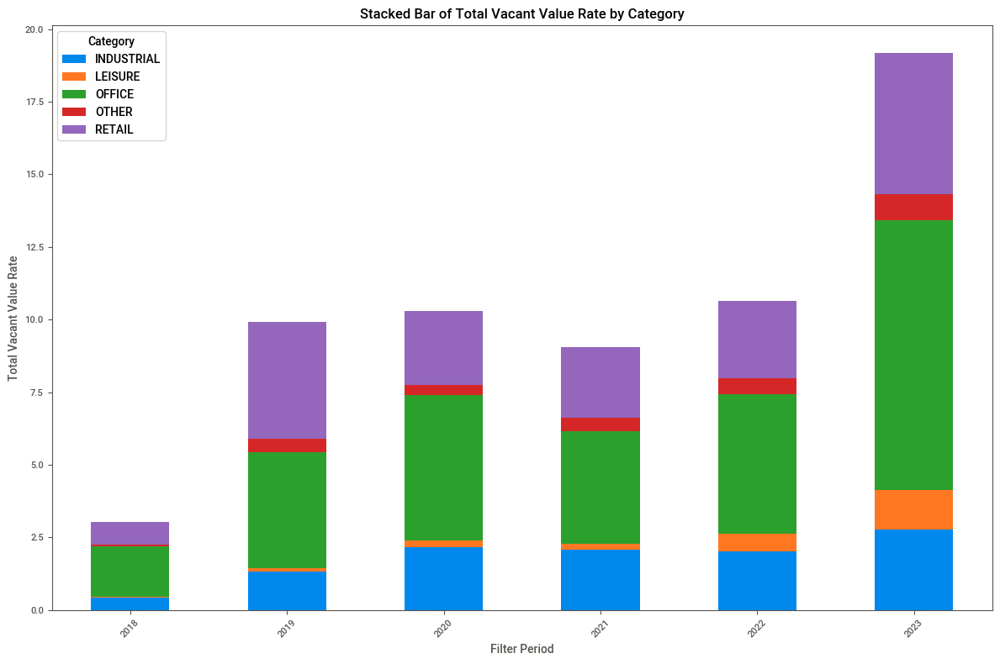

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
vacan1 =vacan_C.reset_index()
vacan1['filterPeriod'] = pd.to_datetime(vacan1['filterPeriod']).dt.year

pivot_vacant = vacan1.pivot_table(index='filterPeriod', columns='voaCategory', values='Vacan_rate', aggfunc='mean')
pivot_area_rate = vacan1.pivot_table(index='filterPeriod', columns='voaCategory', values='VacantAreaRate', aggfunc='mean')
pivot_value_rate = vacan1.pivot_table(index='filterPeriod', columns='voaCategory', values='VacantValueRate', aggfunc='mean')

def plot_stacked_bar_total(data, title, ylabel):
    ax = data.plot(kind='bar', stacked=True, figsize=(12, 8))
    plt.title(title)
    plt.xlabel('Filter Period')
    plt.ylabel(ylabel)
    plt.xticks(rotation=45)
    plt.legend(title='Category')
    plt.tight_layout()
    plt.show()

plot_stacked_bar_total(pivot_vacant, 'Stacked Bar of Total Vacancy Count by Category', 'Total Vacant Count')
plot_stacked_bar_total(pivot_area_rate, 'Stacked Bar of Total Vacant Area Rate by Category', 'Total Vacant Area Rate')
plot_stacked_bar_total(pivot_value_rate, 'Stacked Bar of Total Vacant Value Rate by Category', 'Total Vacant Value Rate')


In [ ]:
pivot_vacant

voaCategory,INDUSTRIAL,LEISURE,OFFICE,OTHER,RETAIL
filterPeriod,,,,,
2018,1.500441,0.043197,1.346801,1.081081,1.516634
2019,3.804797,0.185943,3.785489,2.922756,3.435294
2020,5.882353,0.234035,8.549618,5.344296,4.977169
2021,4.415011,0.298151,7.456140,4.094166,4.545455
2022,4.793028,0.381575,7.971014,3.752535,4.447380
2023,7.370659,1.027485,16.407355,6.493506,10.668380


## By LSOA

In [ ]:
v1_r = v1.groupby(['LSOA','filterPeriod','voaCategory']).Vacant.sum()
v1_c = v1.groupby(['LSOA','filterPeriod','voaCategory']).Vacant.count()
v1_R = pd.merge(v1_r, v1_c,left_on=['LSOA','filterPeriod','voaCategory'], right_on=['LSOA','filterPeriod','voaCategory'],how='inner')
v1_R = v1_R.reset_index().rename(columns={'Vacant_x':'Vacant','Vacant_y':'total'})
v1_R['Vacan_rate'] = (v1_R['Vacant']/v1_R['total'])*100

C:\Users\gg208\AppData\Local\Temp\ipykernel_31488\993115229.py:36: UserWarning: Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.
  plt.tight_layout()


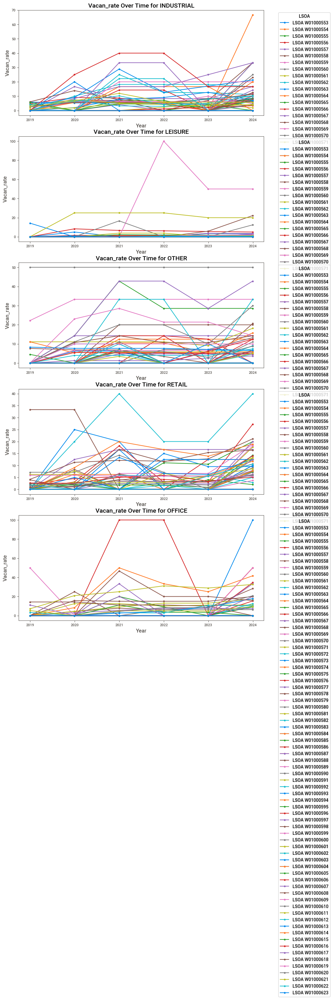

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 假设 v1_merge 是你的 DataFrame

# 获取唯一的 voaCategory 和 LSOA
voa_categories = v1_R['voaCategory'].unique()
lsoas = v1_R['LSOA'].unique()

# 创建一个新的图形窗口
fig, axes = plt.subplots(len(voa_categories), 1, figsize=(10, 5 * len(voa_categories)))

# 如果只有一个类别，axes不会是数组
if len(voa_categories) == 1:
    axes = [axes]

# 遍历每个 voaCategory
for i, category in enumerate(voa_categories):
    ax = axes[i]
    
    # 过滤出当前 category 的数据
    subset = v1_R[v1_R['voaCategory'] == category]
    
    # 遍历每个 LSOA
    for lsoa in lsoas:
        lsoa_data = subset[subset['LSOA'] == lsoa]
        ax.plot(lsoa_data['filterPeriod'], lsoa_data['Vacan_rate'], marker='o', label=f'LSOA {lsoa}')
    
    # 设置图表标题和标签
    ax.set_title(f'Vacan_rate Over Time for {category}', fontsize=14)
    ax.set_xlabel('Year', fontsize=12)
    ax.set_ylabel('Vacan_rate', fontsize=12)
    ax.legend(title='LSOA', bbox_to_anchor=(1.05, 1), loc='upper left')

# 调整布局
plt.tight_layout()
plt.show()


### graph

In [ ]:
# read geopandas dataframe from shapefile

gdf = gpd.read_file('LSOA(WGS84)/534d31f2-3b8c-445a-8728-5fe034f79c812020330-1-2c8ptw.lcpm2.shp')
gdf.head()

,FID,lsoa11cd,lsoa11nm,IMDRank,IMDDecil,Shape__Are,Shape__Len,geometry
0,1,E01000001,City of London 001A,29199,9,343894.195702,3682.367055,"POLYGON ((-10830.126 6714078.454, -10744.067 6..."
1,2,E01000002,City of London 001B,30379,10,583453.103058,3910.314357,"POLYGON ((-9810.492 6713690.893, -9939.862 671..."
2,3,E01000003,City of London 001C,14915,5,147833.971008,1834.896718,"POLYGON ((-10774.139 6714377.672, -10739.050 6..."
3,4,E01000005,City of London 001E,8678,3,491901.220234,3483.118352,"POLYGON ((-8152.031 6712007.933, -8408.171 671..."
4,5,E01000006,Barking and Dagenham 016A,14486,5,372254.489704,3108.596473,"POLYGON ((10147.003 6717211.407, 10381.377 671..."


In [ ]:
# merge original dataframe with geopandas dataframe with the same LSOA

v1_merge = gdf.merge(v1_R, left_on='lsoa11cd', right_on='LSOA', how='inner')
v1_merge.head()

,FID,lsoa11cd,lsoa11nm,IMDRank,IMDDecil,Shape__Are,Shape__Len,geometry,LSOA,filterPeriod,voaCategory,Vacant,total,Vacan_rate
0,33372,W01000553,Pembrokeshire 011A,0,0,4.740796e+07,34218.64129,"POLYGON ((-516057.867 6759058.628, -515971.073...",W01000553,2018-12-31,INDUSTRIAL,0,4,0.0
1,33372,W01000553,Pembrokeshire 011A,0,0,4.740796e+07,34218.64129,"POLYGON ((-516057.867 6759058.628, -515971.073...",W01000553,2018-12-31,LEISURE,0,74,0.0
2,33372,W01000553,Pembrokeshire 011A,0,0,4.740796e+07,34218.64129,"POLYGON ((-516057.867 6759058.628, -515971.073...",W01000553,2018-12-31,OTHER,0,6,0.0
3,33372,W01000553,Pembrokeshire 011A,0,0,4.740796e+07,34218.64129,"POLYGON ((-516057.867 6759058.628, -515971.073...",W01000553,2018-12-31,RETAIL,0,12,0.0
4,33372,W01000553,Pembrokeshire 011A,0,0,4.740796e+07,34218.64129,"POLYGON ((-516057.867 6759058.628, -515971.073...",W01000553,2019-12-31,INDUSTRIAL,1,5,20.0


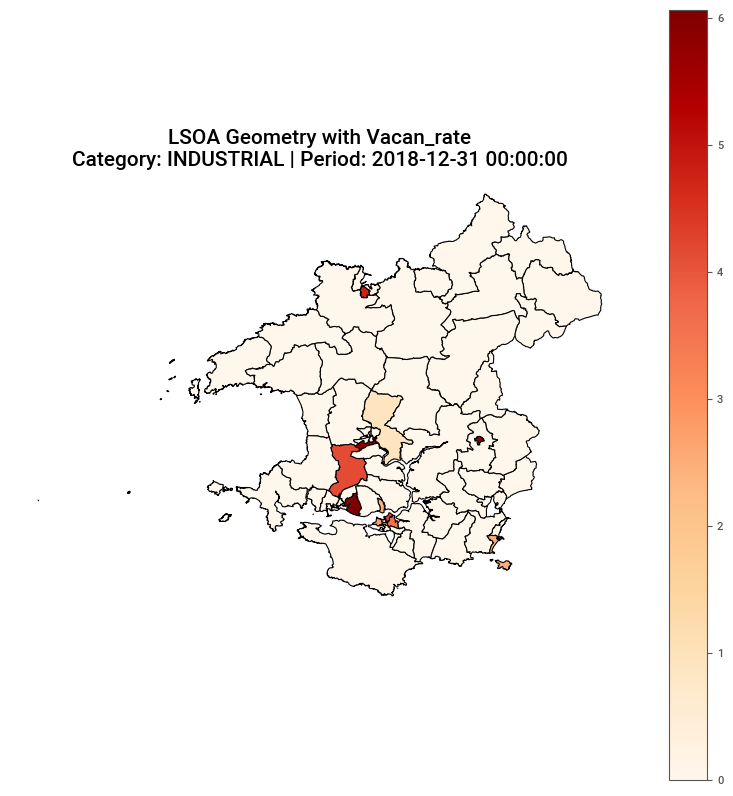

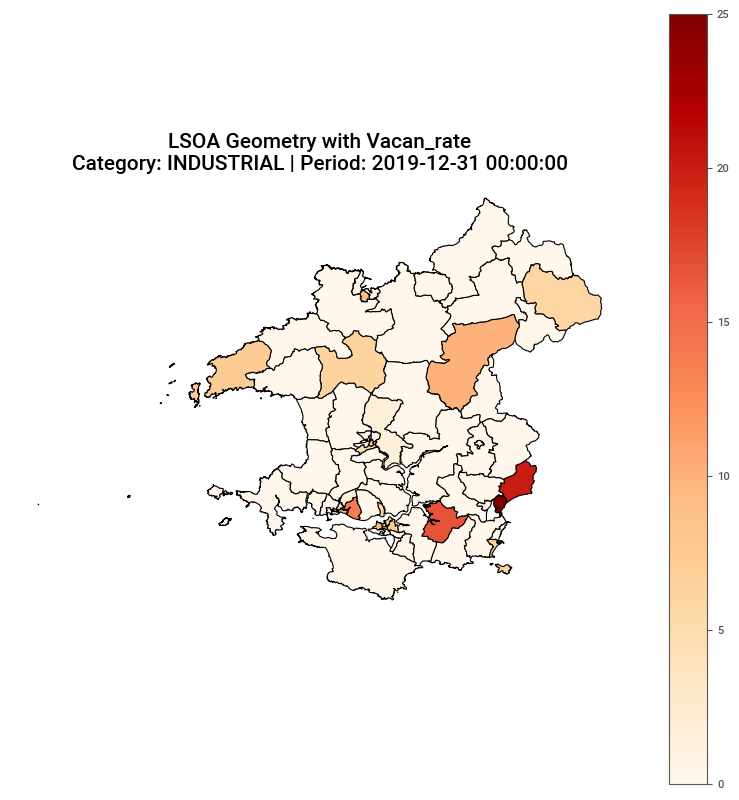

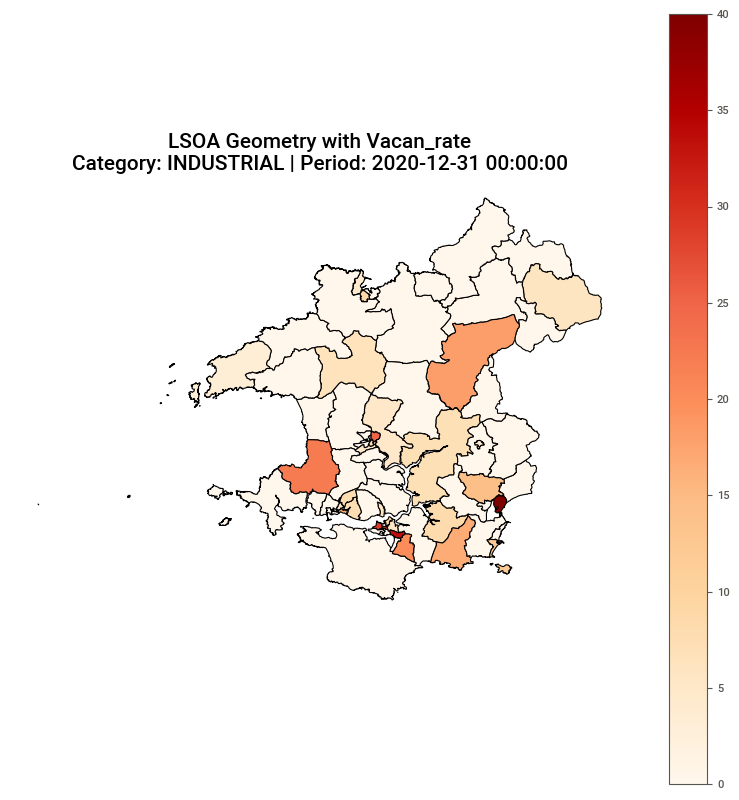

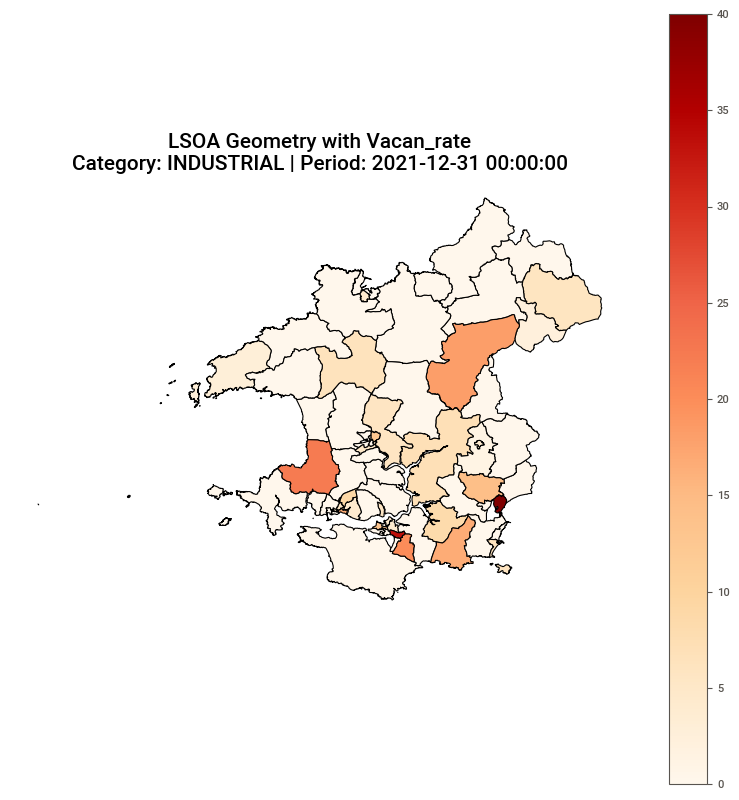

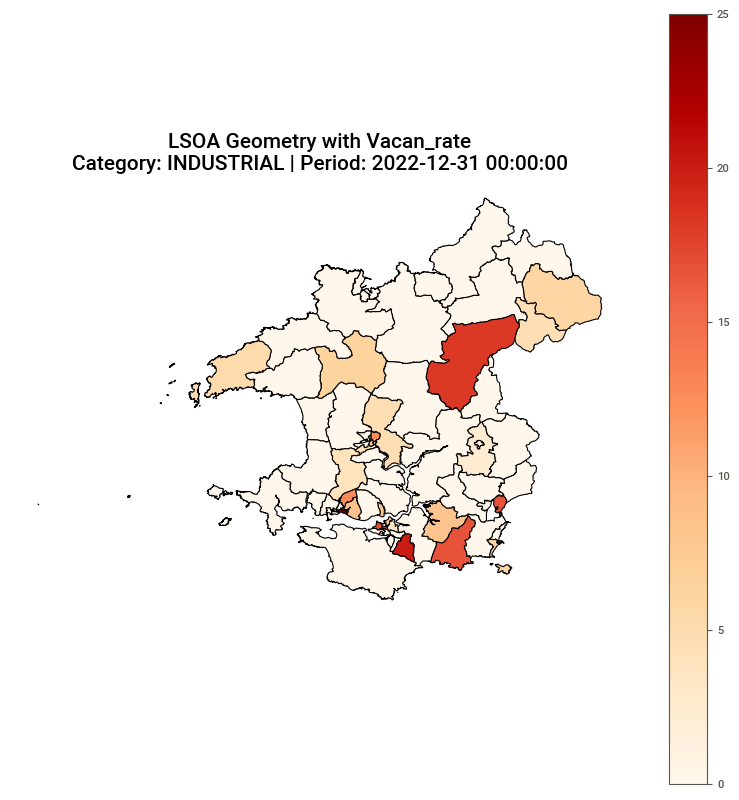

...

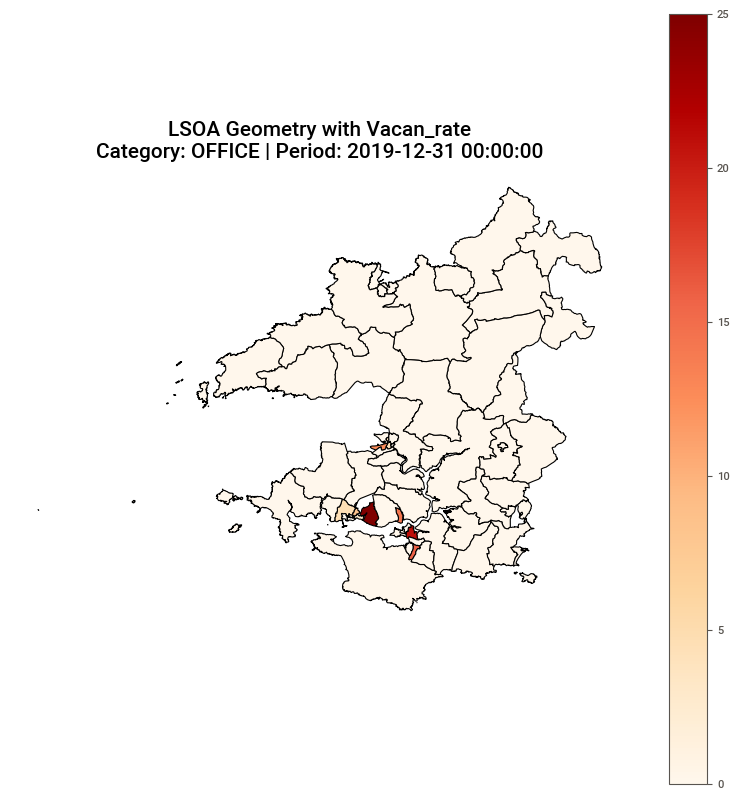

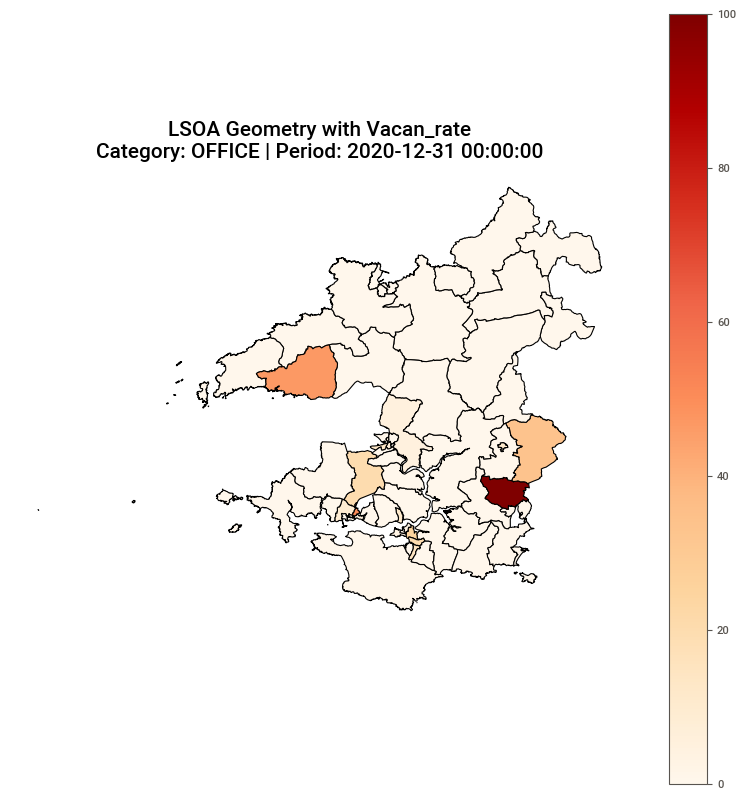

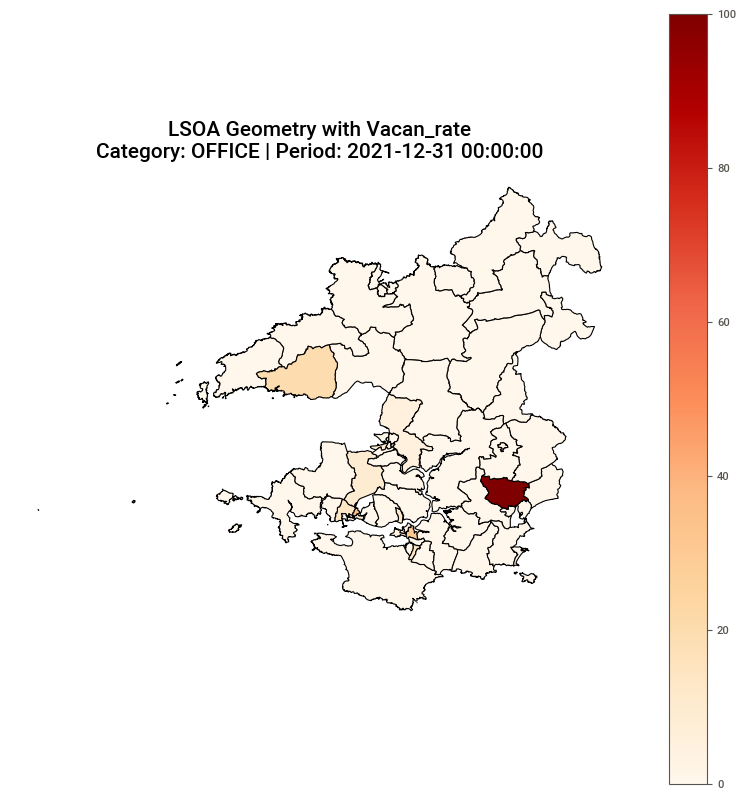

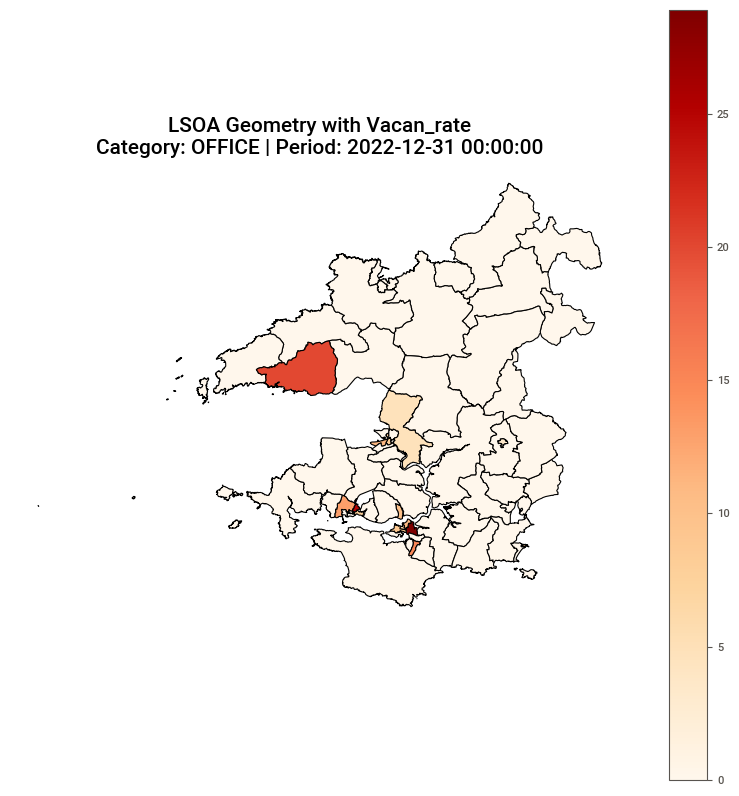

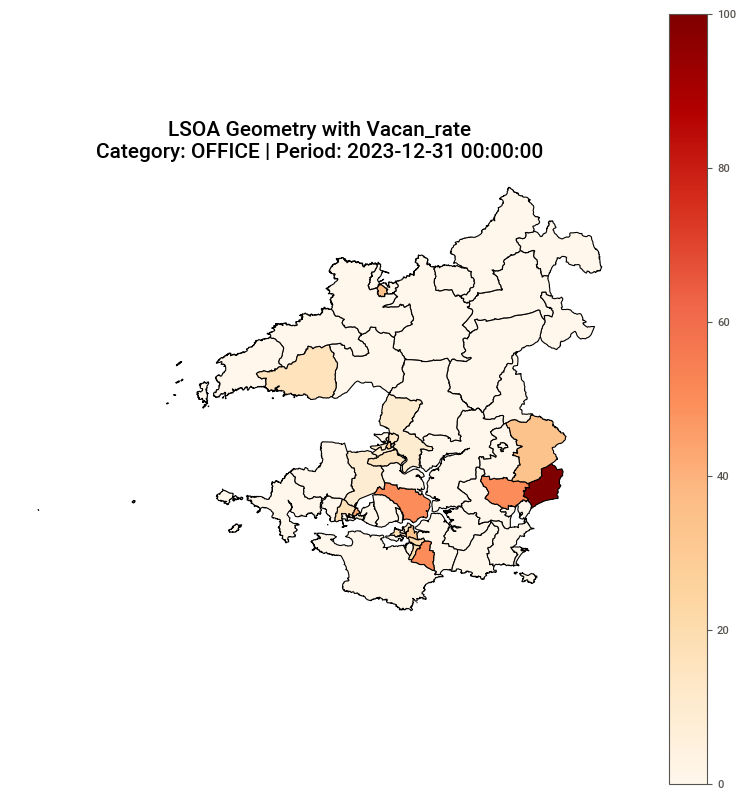

In [ ]:
gdf = gpd.GeoDataFrame(v1_merge, geometry='geometry')

voa_categories = gdf['voaCategory'].unique()
filter_periods = gdf['filterPeriod'].unique()

for category in voa_categories:
    for period in filter_periods:
        # 过滤出当前category和period的数据
        subset = gdf[(gdf['voaCategory'] == category) & (gdf['filterPeriod'] == period)]
        
        # 如果 subset 为空，则跳过
        if subset.empty:
            continue
        
        # 绘制地图
        fig, ax = plt.subplots(1, 1, figsize=(10, 10))
        
        # 按 Vacan_rate 着色，使用 'OrRd' 色图
        subset.plot(column='Vacan_rate', cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='black', legend=True)
        
        # 添加标题
        ax.set_title(f'LSOA Geometry with Vacan_rate\nCategory: {category} | Period: {period}', fontsize=15)
        
        # 移除轴标签
        ax.set_axis_off()

        # 显示图形
        plt.show()


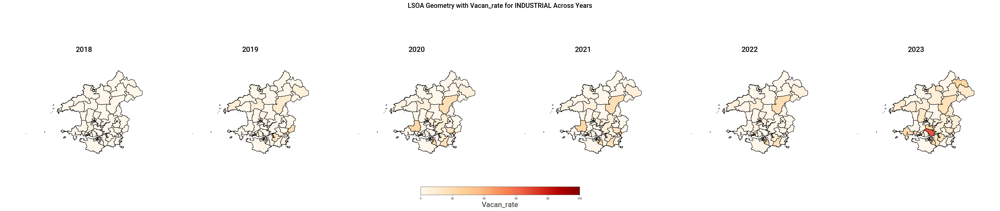

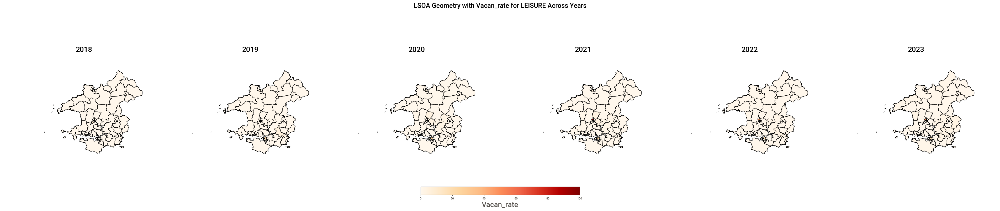

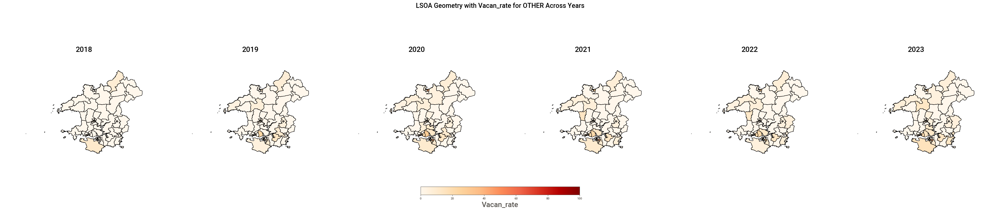

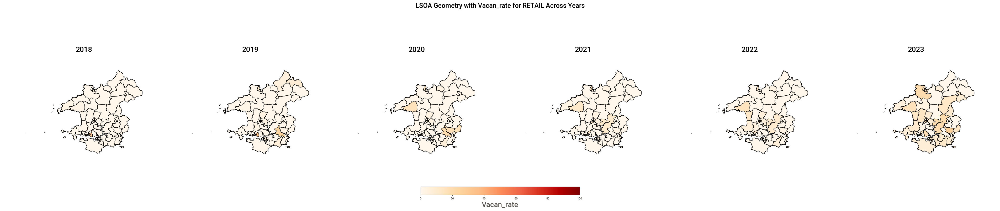

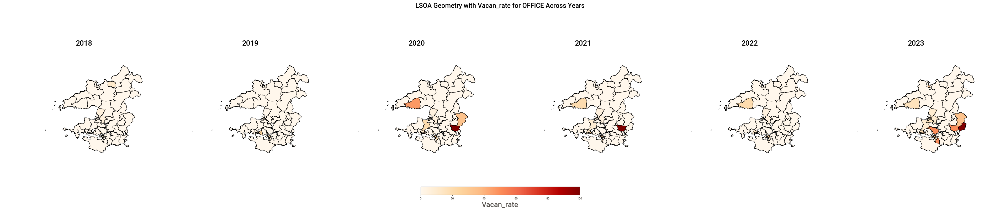

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from shapely.geometry import Polygon

# 确保 v1_merge 是一个 GeoDataFrame
gdf = gpd.GeoDataFrame(v1_merge, geometry='geometry')

# 获取唯一的 voaCategory 和 filterPeriod
voa_categories = gdf['voaCategory'].unique()
filter_periods = sorted(gdf['filterPeriod'].unique())  # 假设你有六个年份

# 定义颜色映射的范围，确保所有子图使用相同的颜色映射
vmin = gdf['Vacan_rate'].min()
vmax = gdf['Vacan_rate'].max()
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
cmap = 'OrRd'

# 遍历每个 voaCategory 生成图像
for category in voa_categories:
    fig, axes = plt.subplots(1, len(filter_periods), figsize=(38, 8), sharex=True, sharey=True,constrained_layout=True)  # 增大 figsize
    
    # 遍历该 category 的每个年份
    for j, period in enumerate(filter_periods):
        # 过滤出当前 category 和 period 的数据
        subset = gdf[(gdf['voaCategory'] == category) & (gdf['filterPeriod'] == period)]
        
        # 如果 subset 为空，则跳过
        if subset.empty:
            continue
        
        # 绘制地图
        subset.plot(column='Vacan_rate', cmap=cmap, linewidth=1, ax=axes[j], edgecolor='black', norm=norm)
    
        # 设置子图标题
        axes[j].set_title(f'{period.year}', fontsize=20)  # 增大字体
        # 减少留白
        axes[j].margins(0.2)  # 0 代表不留白
        

        # 移除轴标签
        axes[j].set_axis_off()

    # 添加一个统一的颜色条，放在底部
    cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=axes, orientation='horizontal', fraction=0.05, pad=0.1)
    cbar.set_label('Vacan_rate', fontsize=20)  # 增大字体

    # 设置整张图的标题
    plt.suptitle(f'LSOA Geometry with Vacan_rate for {category} Across Years', fontsize=18)  # 增大字体
    
    # 调整子图之间的间距，减少留白
    plt.subplots_adjust(wspace=0.02, hspace=0.02, top=0.85, bottom=0.1, left=0.02, right=0.98) 
    
    # 显示图形
    plt.show()




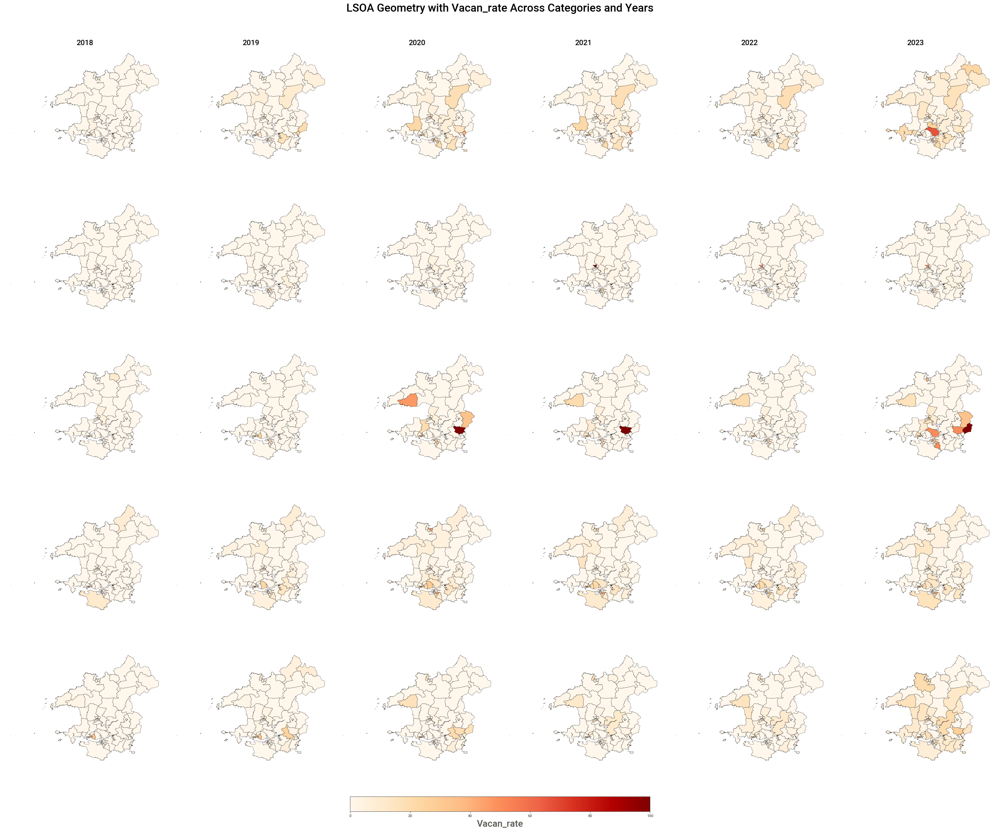

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from itertools import product

# 确保 gdf 是一个 GeoDataFrame
gdf = gpd.GeoDataFrame(v1_merge, geometry='geometry')

# 获取唯一的 voaCategory 和 filterPeriod
voa_categories = sorted(gdf['voaCategory'].unique())
filter_periods = sorted(gdf['filterPeriod'].unique())  # 假设你有六个年份

# 定义颜色映射的范围，确保所有子图使用相同的颜色映射
vmin = gdf['Vacan_rate'].min()
vmax = gdf['Vacan_rate'].max()
norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
cmap = 'OrRd'

# 创建一个 6 列 5 行的网格
fig, axes = plt.subplots(len(voa_categories), len(filter_periods), figsize=(30, 25), sharex=True, sharey=True, constrained_layout=True)

# 遍历 category 和 period 填充图像
for i, (category, period) in enumerate(product(voa_categories, filter_periods)):
    row = i // len(filter_periods)
    col = i % len(filter_periods)
    
    # 过滤出当前 category 和 period 的数据
    subset = gdf[(gdf['voaCategory'] == category) & (gdf['filterPeriod'] == period)]
    
    # 如果 subset 为空，则跳过
    if subset.empty:
        axes[row, col].set_axis_off()
        continue
    
    # 绘制地图
    subset.plot(column='Vacan_rate', cmap=cmap, linewidth=0.3, ax=axes[row, col], edgecolor='black', norm=norm)
    
    # 设置子图标题
    if row == 0:  # 第一行显示年份作为标题
        axes[row, col].set_title(f'{period.year}', fontsize=16)
    if col == 0:  # 第一列显示 category 作为纵向标签
        axes[row, col].set_ylabel(category, fontsize=16)

    # 移除轴标签
    axes[row, col].set_axis_off()

# 添加一个统一的颜色条，放在底部
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=axes, orientation='horizontal', fraction=0.02, pad=0.04)
cbar.set_label('Vacan_rate', fontsize=20)

# 设置整张图的标题
plt.suptitle('LSOA Geometry with Vacan_rate Across Categories and Years', fontsize=24)

# 显示图形
plt.show()


In [ ]:
voa_categories

['INDUSTRIAL', 'LEISURE', 'OFFICE', 'OTHER', 'RETAIL']

In [ ]:
import sweetviz as sv

# EDA using Sweetviz
sweet_report = sv.analyze(df, pairwise_analysis="off")

# Saving results to HTML file
sweet_report.show_html('sweetviz_report.html')

c:\Users\gg208\anaconda3\envs\ditu\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Feature: year                                |██████████| [100%]   00:04 -> (00:00 left)


Report sweetviz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


# Clustering LSOA

In [ ]:
GVP = pd.read_csv('GVP_per.csv').drop(columns='Unnamed: 0')

In [ ]:
GVP

,LSOA,2018_ratio,2019_ratio,2020_ratio,2021_ratio
0,W01000553,0.010665,0.009979,0.008549,0.012409
1,W01000554,0.005210,0.005201,0.004645,0.005802
2,W01000555,0.008533,0.008496,0.009634,0.011862
3,W01000556,0.007200,0.006586,0.005626,0.006686
4,W01000557,0.007667,0.007800,0.007415,0.009332
...,...,...,...,...,...
66,W01000619,0.012307,0.010318,0.009049,0.010859
67,W01000620,0.033467,0.038211,0.031961,0.042364
68,W01000621,0.015287,0.015357,0.012686,0.016688
69,W01000622,0.027125,0.030613,0.032733,0.037699


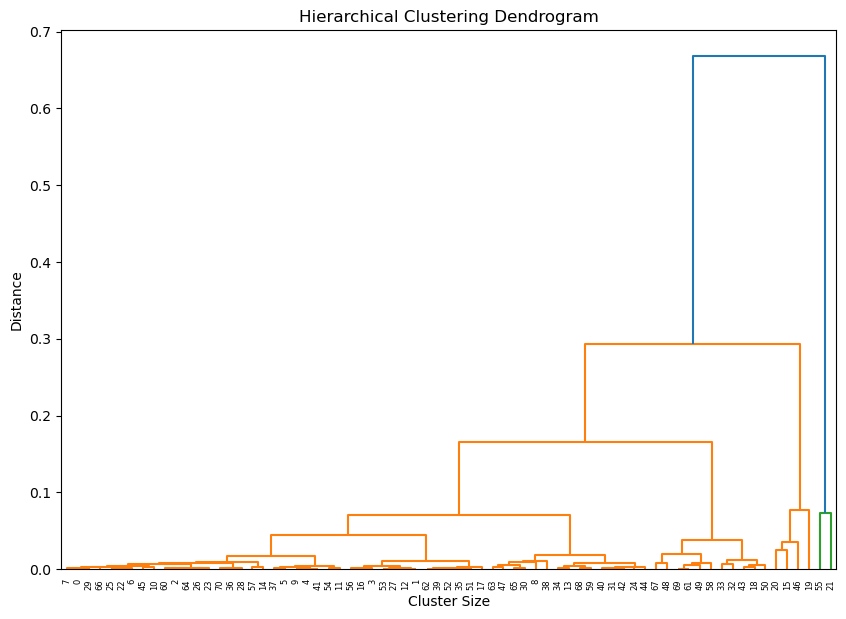

         LSOA  2018_ratio  2019_ratio  2020_ratio  2021_ratio  Cluster_Label
0  W01000553     0.010665    0.009979    0.008549    0.012409              4
1  W01000554     0.005210    0.005201    0.004645    0.005802              4
2  W01000555     0.008533    0.008496    0.009634    0.011862              4
3  W01000556     0.007200    0.006586    0.005626    0.006686              4
4  W01000557     0.007667    0.007800    0.007415    0.009332              4


In [ ]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler

X=GVP[['2018_ratio','2019_ratio','2020_ratio','2021_ratio']]
scaler_standard = StandardScaler()
X_standardized = scaler_standard.fit_transform(X)


linked = linkage(X, method='ward')


plt.figure(figsize=(10, 7))
dendrogram(linked, orientation='top', labels=GVP.index.astype(str), distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()


clusters = fcluster(linked, 0.15, criterion='distance')

GVP['Cluster_Label'] = clusters

print(GVP.head())

In [ ]:
GVP['Cluster_Label'].unique()

array([4, 2, 3, 1])